#Tutorial OpenCV

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np

Largura em pixels: 225
225
Qtde de canais: 3


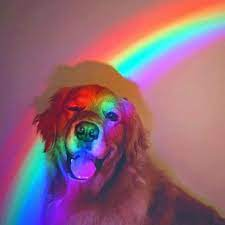

True

In [ ]:
# Importação das bibliotecas
import cv2
# Leitura da imagem com a função imread()
imagem = cv2.imread('entrada.jpg')
print('Largura em pixels: ', end='')
print(imagem.shape[1])
#largura da imagem print('Altura em pixels: ', end='')
print(imagem.shape[0])
#altura da imagem
print('Qtde de canais: ', end='')
print(imagem.shape[2])
# Mostra a imagem com a função imshow
cv2_imshow(imagem)
cv2.waitKey(0) #espera pressionar qualquer tecla
# Salvar a imagem no disco com função imwrite()
cv2.imwrite("saida.jpg", imagem)

In [ ]:
import cv2 
imagem = cv2.imread('ponte.png') 
(b, g, r) = imagem[0, 0] #veja que a ordem BGR e não RGB 
print('O pixel (0, 0) tem as seguintes cores:') 
print('Vermelho:', r, 'Verde:', g, 'Azul:', b)  

O pixel (0, 0) tem as seguintes cores:
Vermelho: 255 Verde: 255 Azul: 255


Resultado de imagem com todos os pixels substituidos pela cor azul.

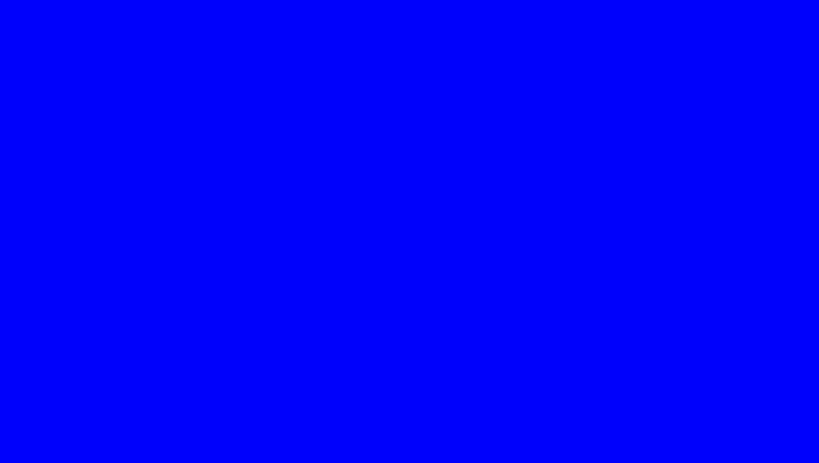

In [ ]:
imagem = cv2.imread('ponte.png') 
for y in range(0, imagem.shape[0]):
   for x in range(0, imagem.shape[1]):
     imagem[y, x] = (255,0,0)
cv2_imshow(imagem) 

A cada 10 pixels criar um quadrado amarelo de 5x5 pixels

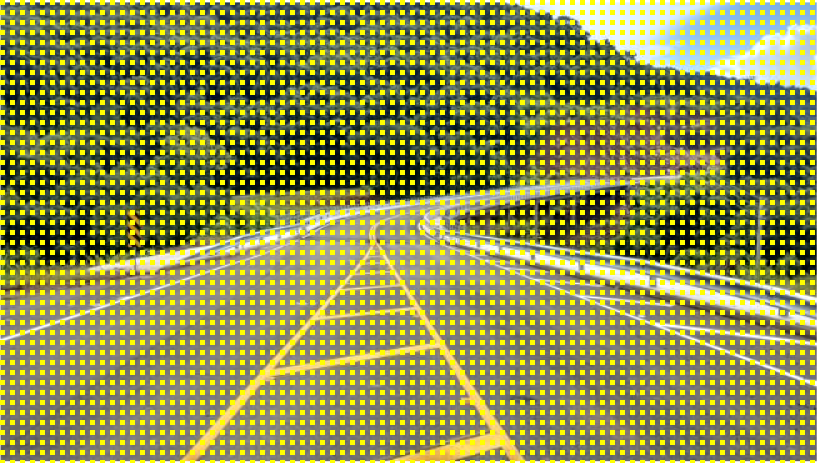

In [ ]:
imagem = cv2.imread('ponte.png') 
for y in range(0, imagem.shape[0], 10): #percorre linhas
   for x in range(0, imagem.shape[1], 10): #percorre colunas
     imagem[y:y+5, x: x+5] = (0,255,255)
cv2_imshow(imagem)

Corte de imagem

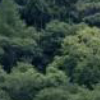

True

In [ ]:
imagem = cv2.imread('ponte.png')
recorte = imagem[100:200, 100:200]
cv2_imshow(recorte)
cv2.imwrite("recorte.jpg", recorte) #salva no disco 

Redimensionamento

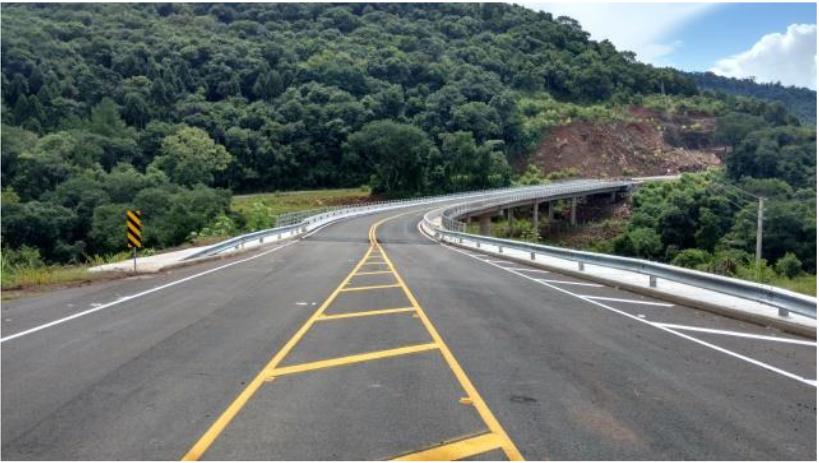

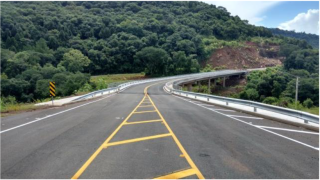

In [ ]:
img = cv2.imread('ponte.png')
cv2_imshow(img)
largura = img.shape[1]
altura = img.shape[0]
proporcao = float(altura/largura)
largura_nova = 320 #em pixels
altura_nova = int(largura_nova*proporcao)
tamanho_novo = (largura_nova, altura_nova)
img_redimensionada = cv2.resize(img,
tamanho_novo, interpolation = cv2.INTER_AREA)
cv2_imshow(img_redimensionada)

Espelhamento de imagem

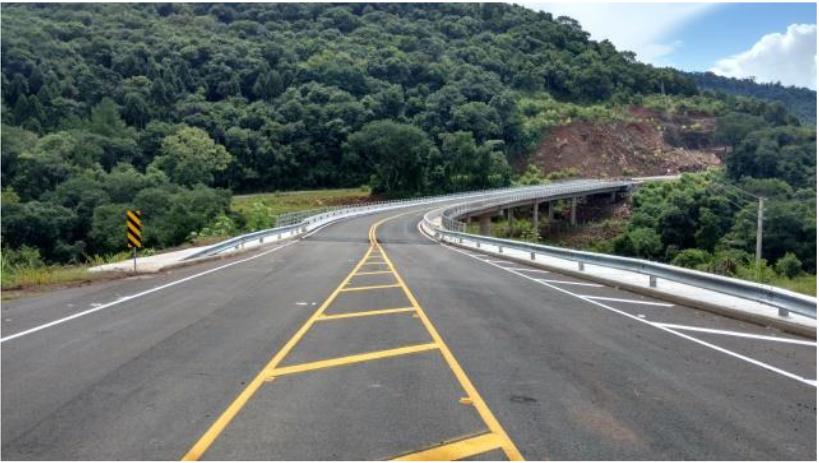

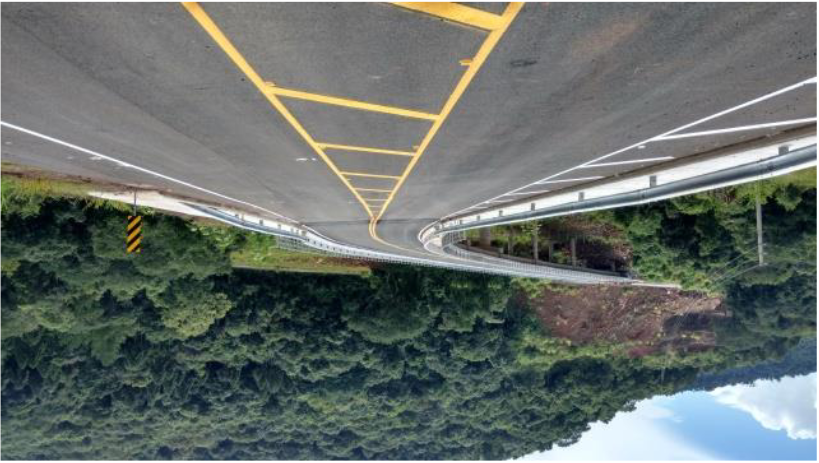

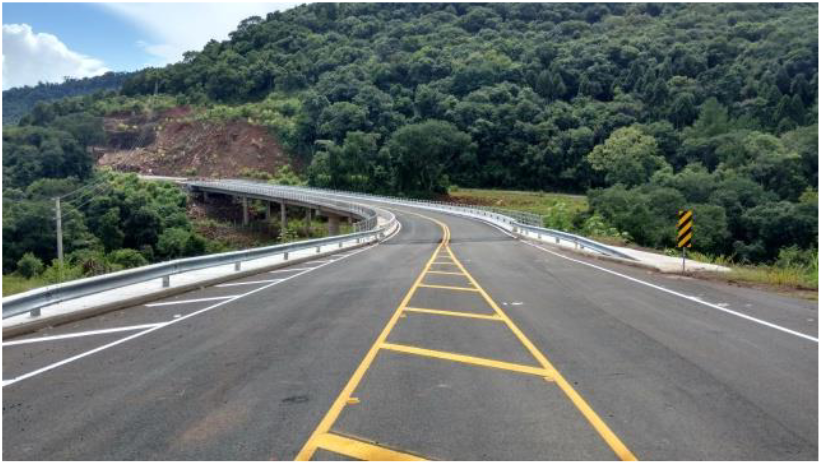

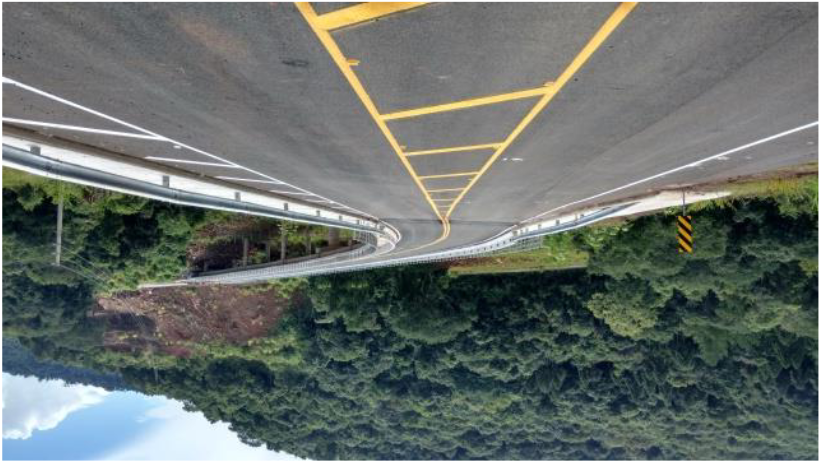

In [ ]:
img = cv2.imread('ponte.png') 
cv2_imshow(img) 
flip_horizontal = img[::-1,:]#comando equivalente abaixo 
#flip_horizontal = cv2.flip(img, 1)  
cv2_imshow(flip_horizontal) 
flip_vertical = img[:,::-1] #comando equivalente abaixo 
#flip_vertical = cv2.flip(img, 0)  
cv2_imshow(flip_vertical) 
flip_hv = img[::-1,::-1] #comando equivalente abaixo  
#flip_hv = cv2.flip(img, -1) 
cv2_imshow(flip_hv) 

Rotacionando uma imagem

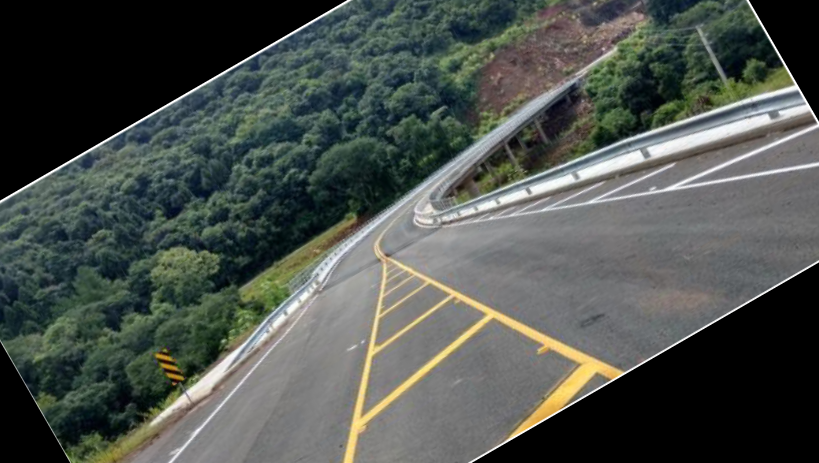

In [ ]:
img = cv2.imread('ponte.png') 
(alt, lar) = img.shape[:2] #captura altura e largura 
centro = (lar // 2, alt // 2) #acha o centro  
M = cv2.getRotationMatrix2D(centro, 30, 1.0)#30 graus 
img_rotacionada = cv2.warpAffine(img, M, (lar, alt))  
cv2_imshow(img_rotacionada) 

Modificando sistema de cores

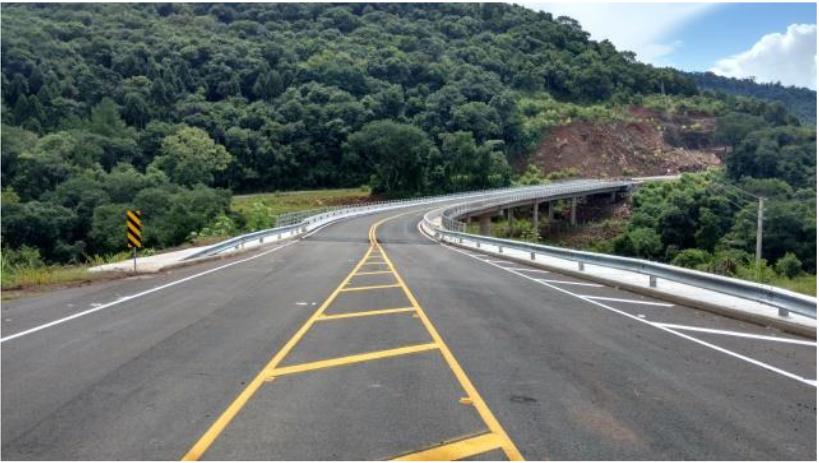

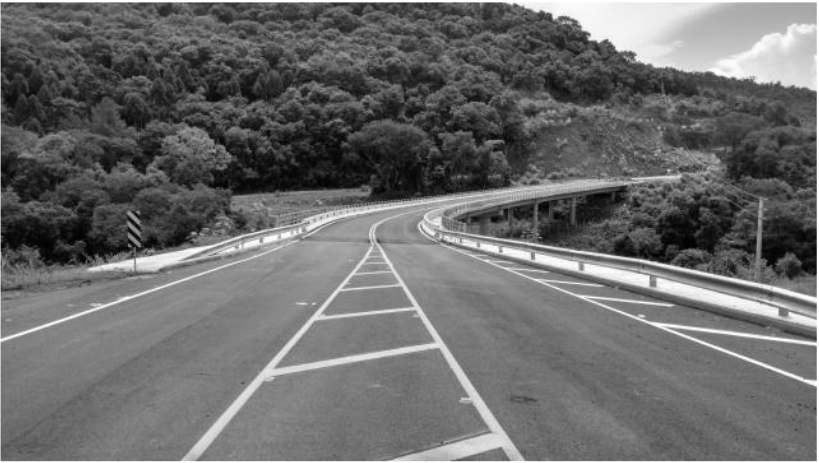

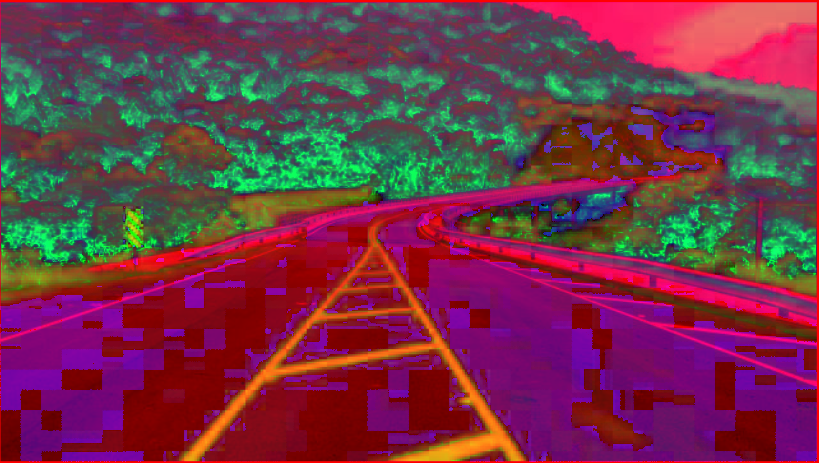

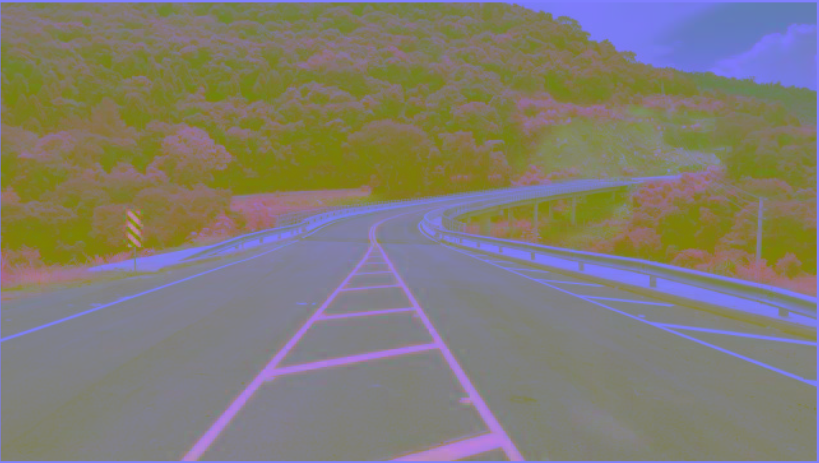

In [ ]:
img = cv2.imread('ponte.png')
cv2_imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
cv2_imshow(lab)

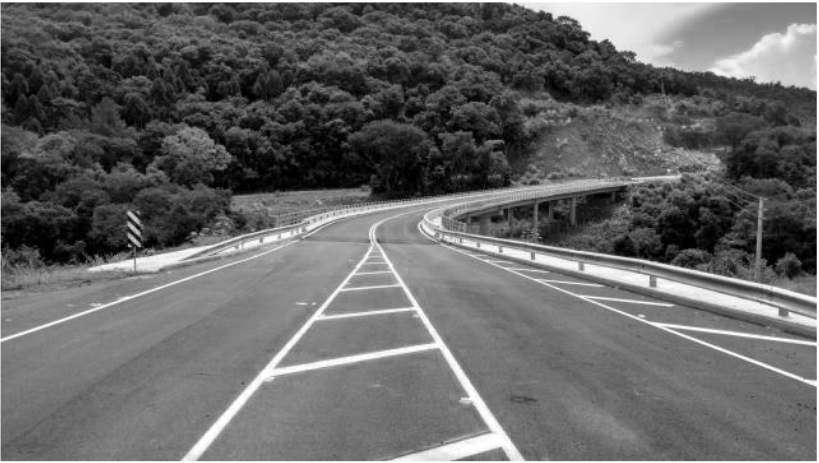

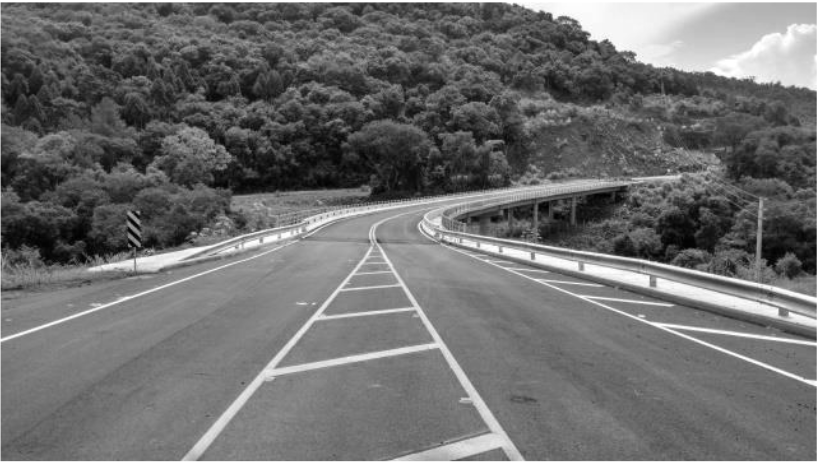

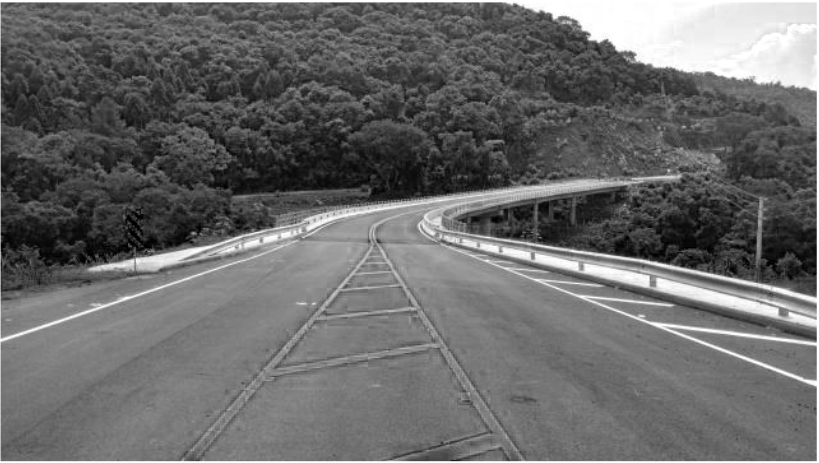

In [ ]:
img = cv2.imread('ponte.png') 
(canalAzul, canalVerde, canalVermelho) = cv2.split(img)
cv2_imshow(canalVermelho) 
cv2_imshow(canalVerde) 
cv2_imshow(canalAzul) 

In [ ]:
resultado = cv2.merge([canalAzul, canalVerde, canalVermelho]) 

In [ ]:
img = cv2.imread('ponte.png')  
(canalAzul, canalVerde, canalVermelho) = cv2.split(img)  
zeros = np.zeros(img.shape[:2], dtype = "uint8")  
cv2_imshow(cv2.merge([zeros, zeros, canalVermelho]))  
cv2_imshow(cv2.merge([zeros, canalVerde, zeros])) 
cv2_imshow(cv2.merge([canalAzul, zeros, zeros])) 
cv2_imshow(img) 

Histograma de equalização de imagem

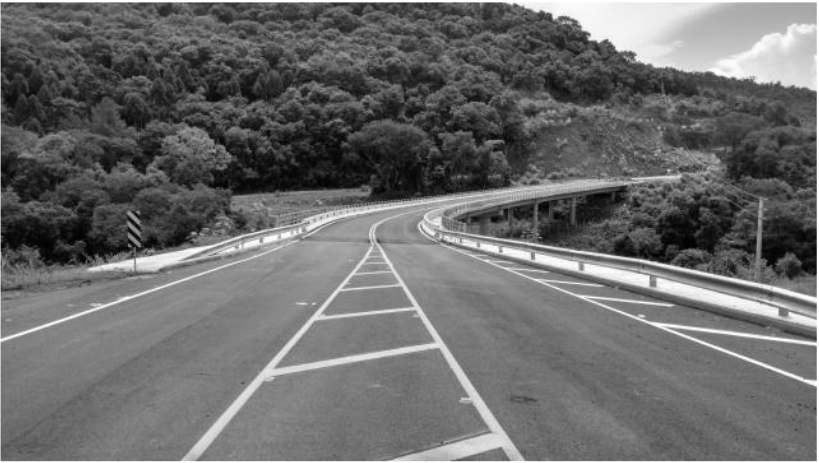

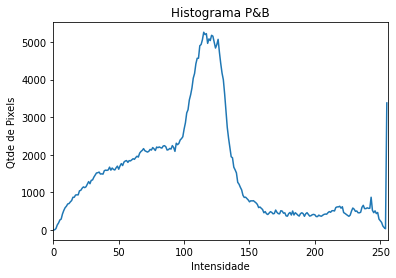

In [ ]:
from matplotlib import pyplot as plt
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #converte P&B 
cv2_imshow(img) 
#Função calcHist para calcular o histograma da imagem 
h = cv2.calcHist([img], [0], None, [256], [0, 256]) 
plt.figure() 
plt.title("Histograma P&B") 
plt.xlabel("Intensidade") 
plt.ylabel("Qtde de Pixels") 
plt.plot(h) 
plt.xlim([0, 256]) 
plt.show() 

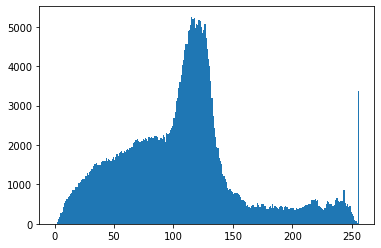

In [ ]:
plt.hist(img.ravel(),256,[0,256]) 
plt.show()

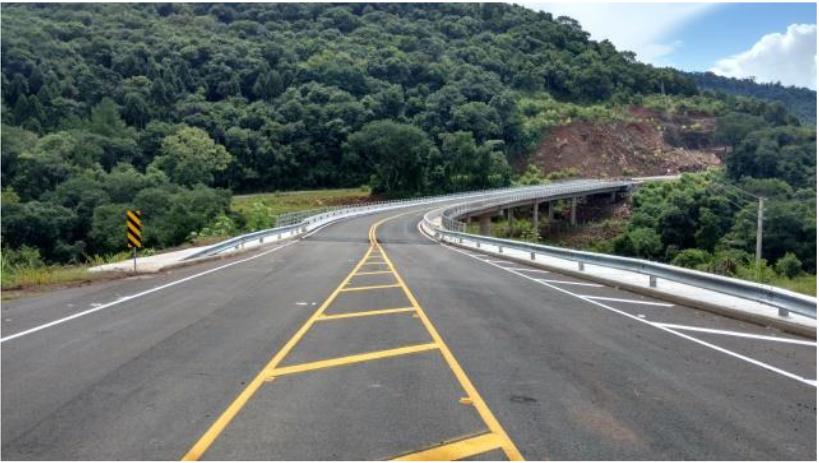

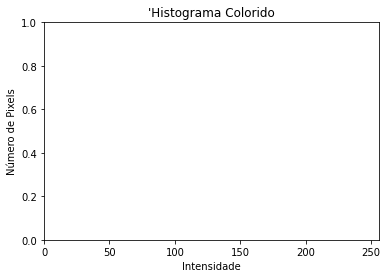

In [ ]:
img = cv2.imread('ponte.png')
cv2_imshow(img)
#Separa os canais
canais = cv2.split(img)
cores = ("b", "g", "r")
plt.figure()
plt.title("'Histograma Colorido")
plt.xlabel("Intensidade")
plt.ylabel("Número de Pixels")

for (canal, cor) in zip(canais, cores):
  hist = cv2.calcHist([canal], [0], None, [256], [0, 256])
  
plt.xlim([0, 256])
plt.show() 

Equalização de histograma

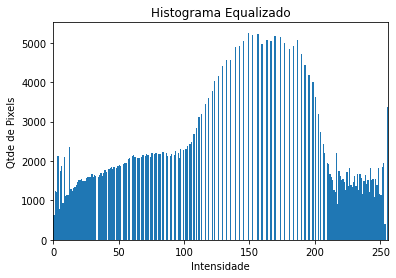

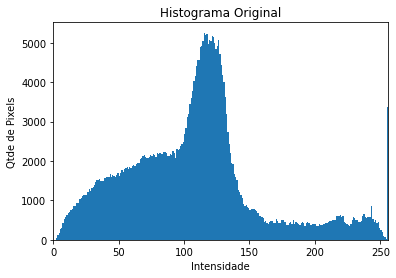

In [ ]:
img = cv2.imread('ponte.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
h_eq = cv2.equalizeHist(img)
plt.figure()
plt.title("Histograma Equalizado")
plt.xlabel("Intensidade")
plt.ylabel("Qtde de Pixels")
plt.hist(h_eq.ravel(), 256, [0,256])
plt.xlim([0, 256])
plt.show()
plt.figure()
plt.title("Histograma Original")
plt.xlabel("Intensidade")
plt.ylabel("Qtde de Pixels")
plt.hist(img.ravel(), 256, [0,256])
plt.xlim([0, 256])
plt.show()

Suavização por cálculo da média

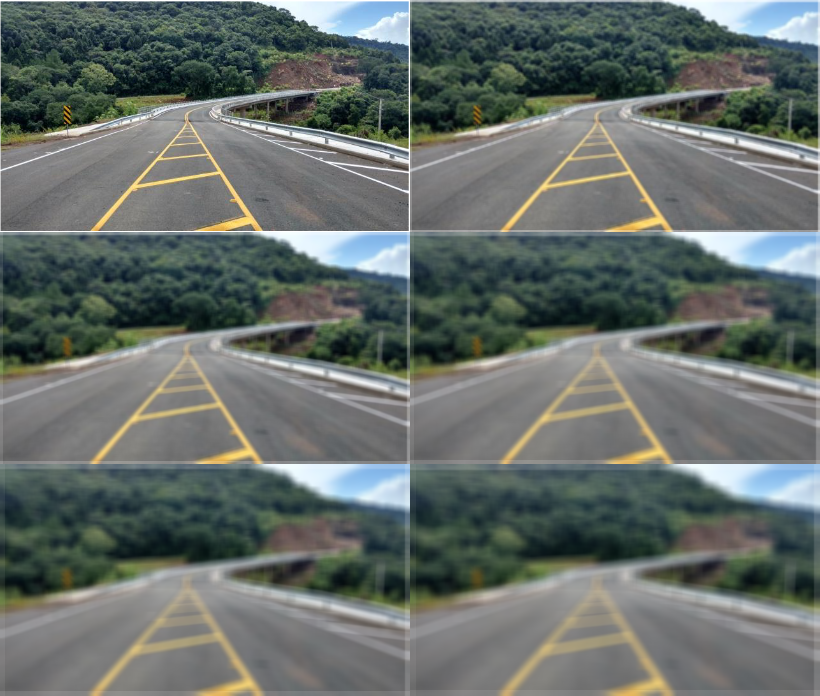

In [ ]:
img = cv2.imread('ponte.png') 
img = img[::2,::2] # Diminui a imagem  
suave = np.vstack([np.hstack([img,cv2.blur(img, ( 3,  3))]),np.hstack([cv2.blur(img, (5,5)), cv2.blur(img, ( 7,  7))]),np.hstack([cv2.blur(img, (9,9)), cv2.blur(img, (11, 11))]),])  
cv2_imshow(suave) 

Suavização pela mediana

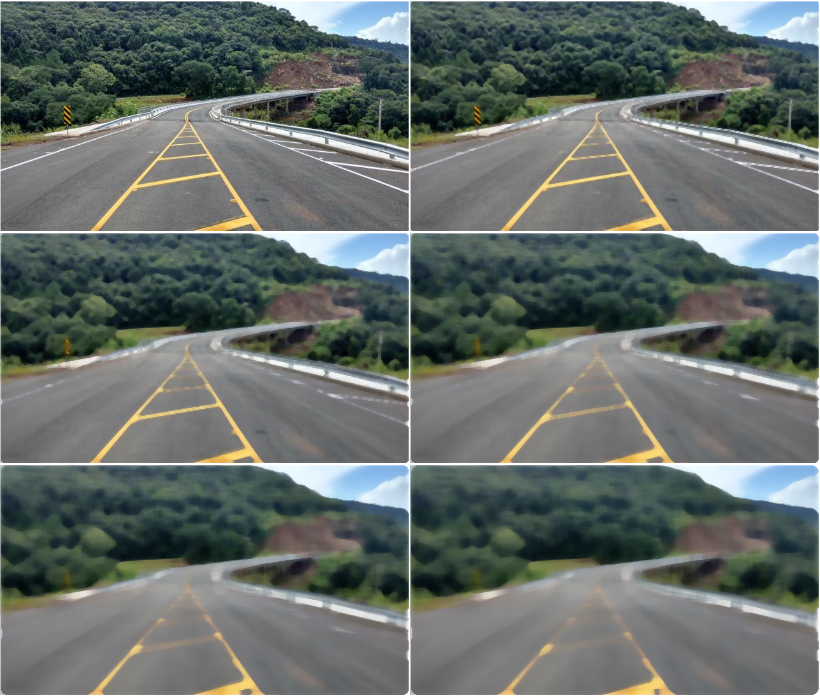

In [ ]:
img = cv2.imread('ponte.png')
img = img[::2,::2] # Diminui a imagem
suave = np.vstack([
np.hstack([img,
  cv2.medianBlur(img,  3)]),
  np.hstack([cv2.medianBlur(img,  5),
  cv2.medianBlur(img,  7)]),
  np.hstack([cv2.medianBlur(img,  9),
  cv2.medianBlur(img, 11)]),
  ])
cv2_imshow(suave)

Suavização bilateral

In [ ]:
img = cv2.imread('ponte.png')
img = img[::2,::2] # Diminui a imagem
suave = np.vstack([
np.hstack([img,
  cv2.bilateralFilter(img,  3, 21, 21)]),
  np.hstack([cv2.bilateralFilter(img,  5, 35, 35),
  cv2.bilateralFilter(img,  7, 49, 49)]),
  np.hstack([cv2.bilateralFilter(img,  9, 63, 63),
  cv2.bilateralFilter(img, 11, 77, 77)])
]) 

Binarização com limiar

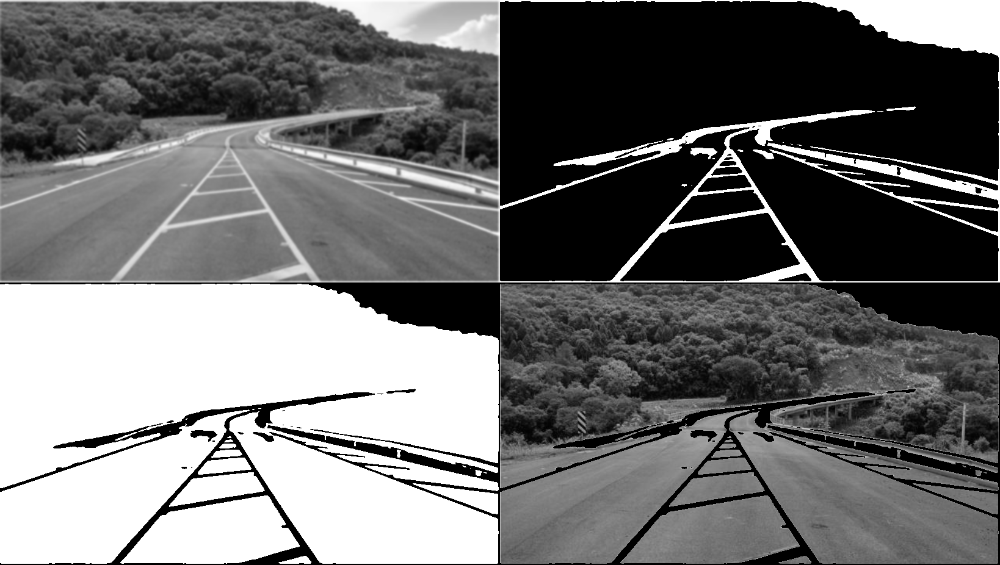

In [ ]:
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
suave = cv2.GaussianBlur(img, (7, 7), 0) # aplica blur  
(T, bin) = cv2.threshold(suave, 160, 255, cv2.THRESH_BINARY) 
(T, binI) = cv2.threshold(suave, 160, 255, cv2.THRESH_BINARY_INV) 
resultado = np.vstack([  np.hstack([suave, bin]),  np.hstack([binI, cv2.bitwise_and(img, img, mask = binI)])  ])   
cv2_imshow(resultado) 

Threshold adaptativo

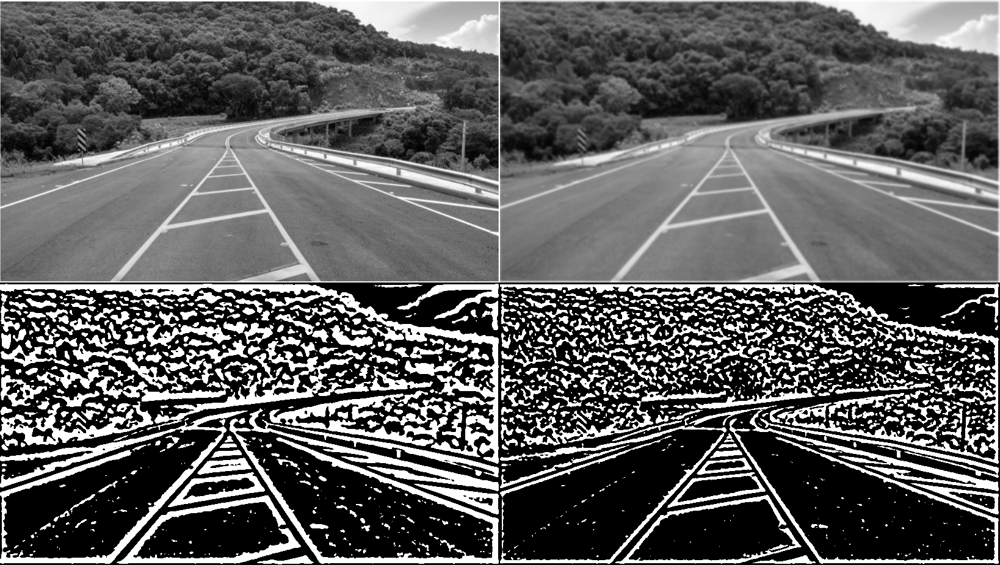

In [ ]:
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # converte  
suave = cv2.GaussianBlur(img, (7, 7), 0) # aplica blur   
bin1 = cv2.adaptiveThreshold(suave, 255,  cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 21, 5) 
bin2 = cv2.adaptiveThreshold(suave, 255,  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,          21, 5)  
resultado = np.vstack([  np.hstack([img, suave]),  np.hstack([bin1, bin2])  ])   
cv2_imshow(resultado)

In [ ]:
!pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.7 MB 8.1 MB/s 


Threshold com Otsu e Riddler-Calvard

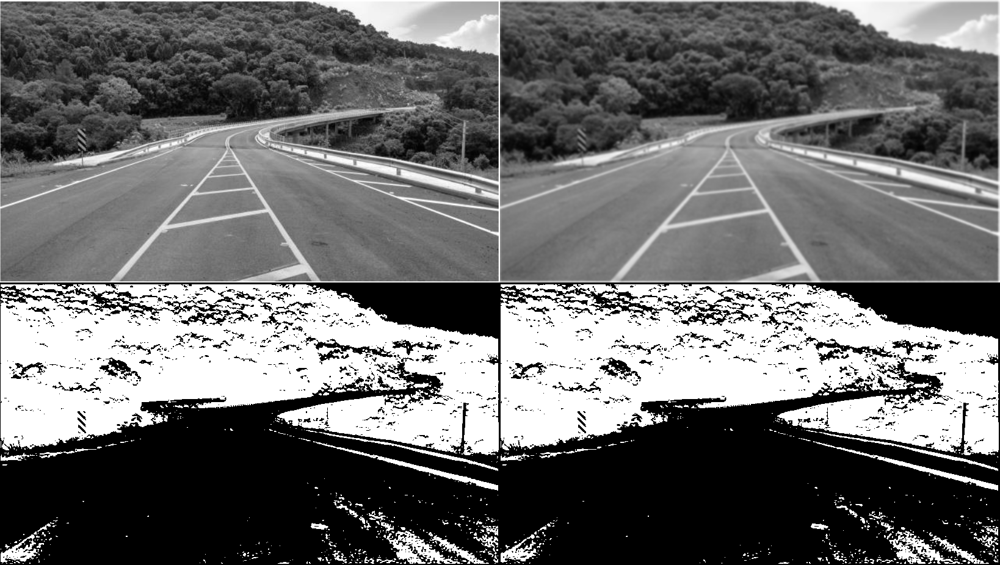

In [ ]:
import mahotas
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # converte  
suave = cv2.GaussianBlur(img, (7, 7), 0) # aplica blur  
T = mahotas.thresholding.otsu(suave) 
temp = img.copy() 
temp[temp > T] = 255 
temp[temp < 255] = 0 
temp = cv2.bitwise_not(temp) 
T = mahotas.thresholding.rc(suave) 
temp2 = img.copy() 
temp2[temp2 > T] = 255 
temp2[temp2 < 255] = 0 
temp2 = cv2.bitwise_not(temp2) 
resultado = np.vstack([  np.hstack([img, suave]),  np.hstack([temp, temp2])  ])  
cv2_imshow(resultado) 

Sobel

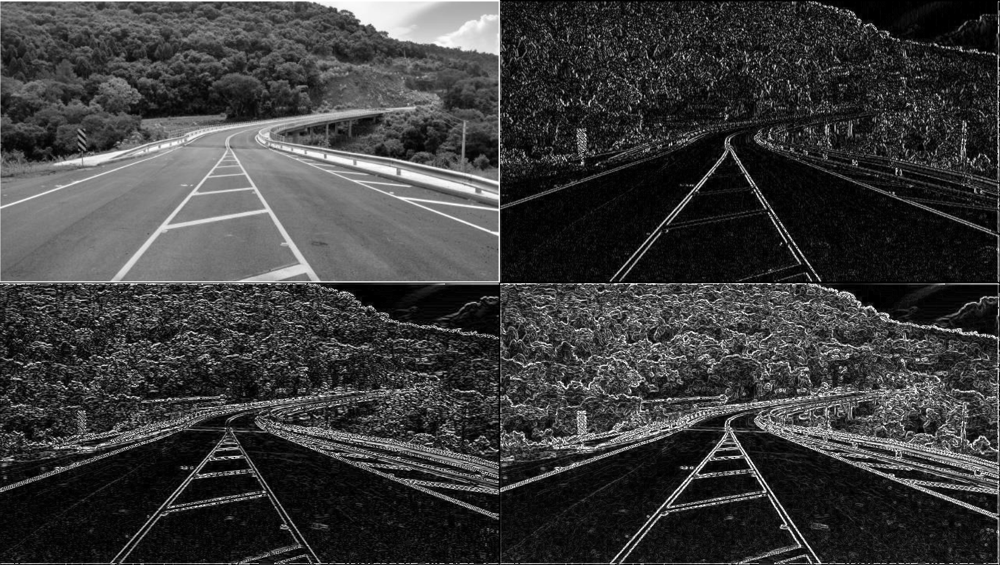

In [ ]:
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
sobelX = cv2.Sobel(img, cv2.CV_64F, 1, 0) 
sobelY = cv2.Sobel(img, cv2.CV_64F, 0, 1) 
sobelX = np.uint8(np.absolute(sobelX)) 
sobelY = np.uint8(np.absolute(sobelY)) 
sobel = cv2.bitwise_or(sobelX, sobelY)  
resultado = np.vstack([  np.hstack([img,    sobelX]),  np.hstack([sobelY, sobel])  ])   
cv2_imshow(resultado) 


Filtro Laplaciano

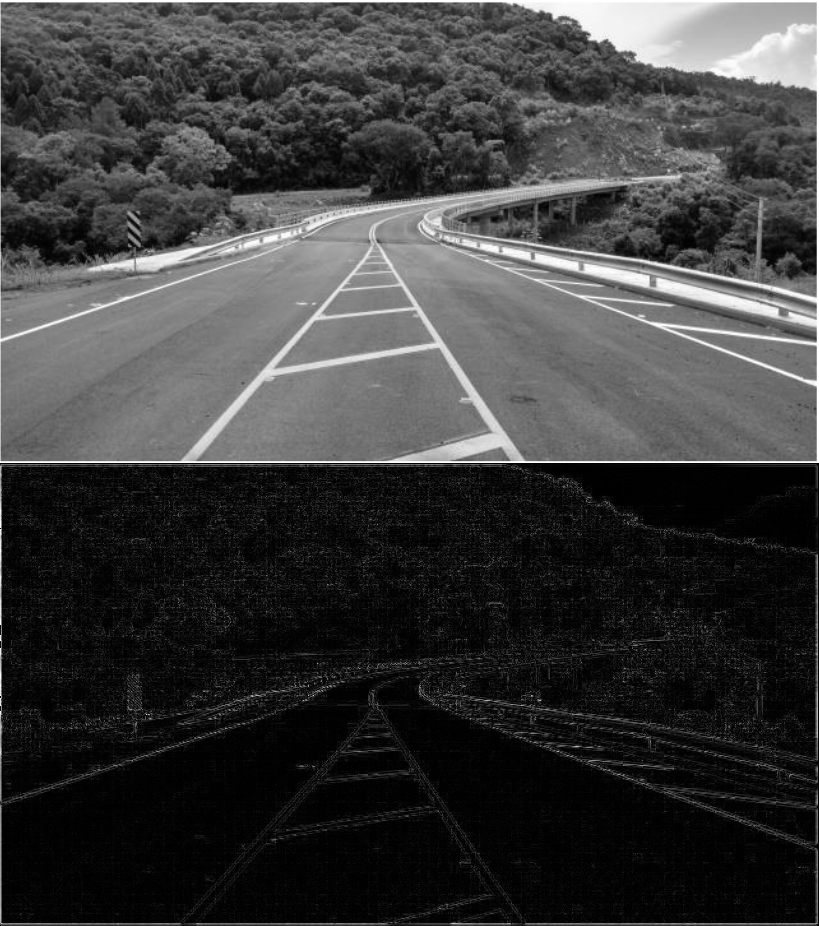

In [ ]:
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
lap = cv2.Laplacian(img, cv2.CV_64F) 
lap = np.uint8(np.absolute(lap)) 
resultado = np.vstack([img, lap])  
cv2_imshow(resultado) 

Detector de bordas Canny

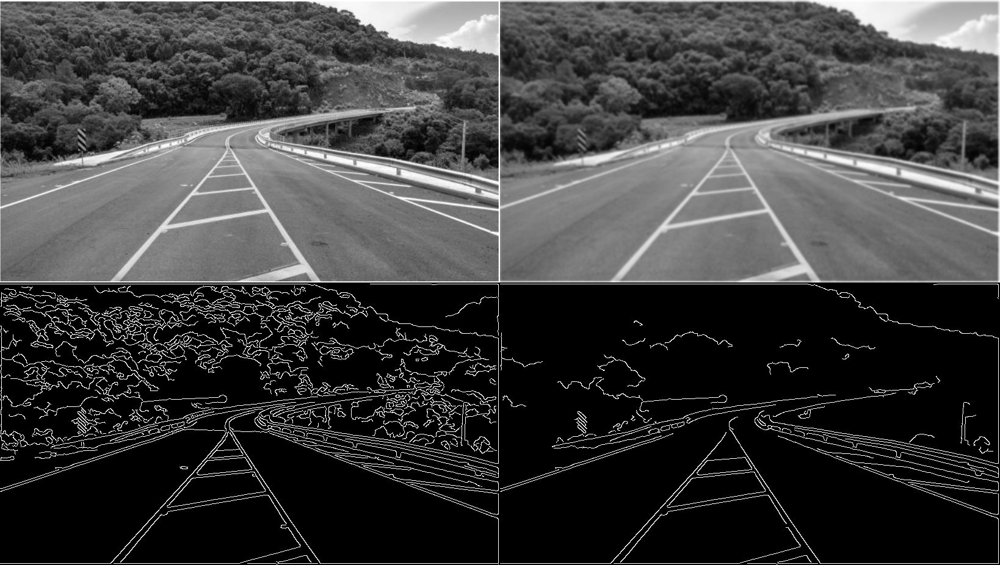

In [ ]:
img = cv2.imread('ponte.png') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
suave = cv2.GaussianBlur(img, (7, 7), 0)  
canny1 = cv2.Canny(suave, 20, 120) 
canny2 = cv2.Canny(suave, 70, 200) 
resultado = np.vstack([  np.hstack([img,    suave ]),  np.hstack([canny1, canny2])  ])  
cv2_imshow(resultado) 

Identificando e contando objetos

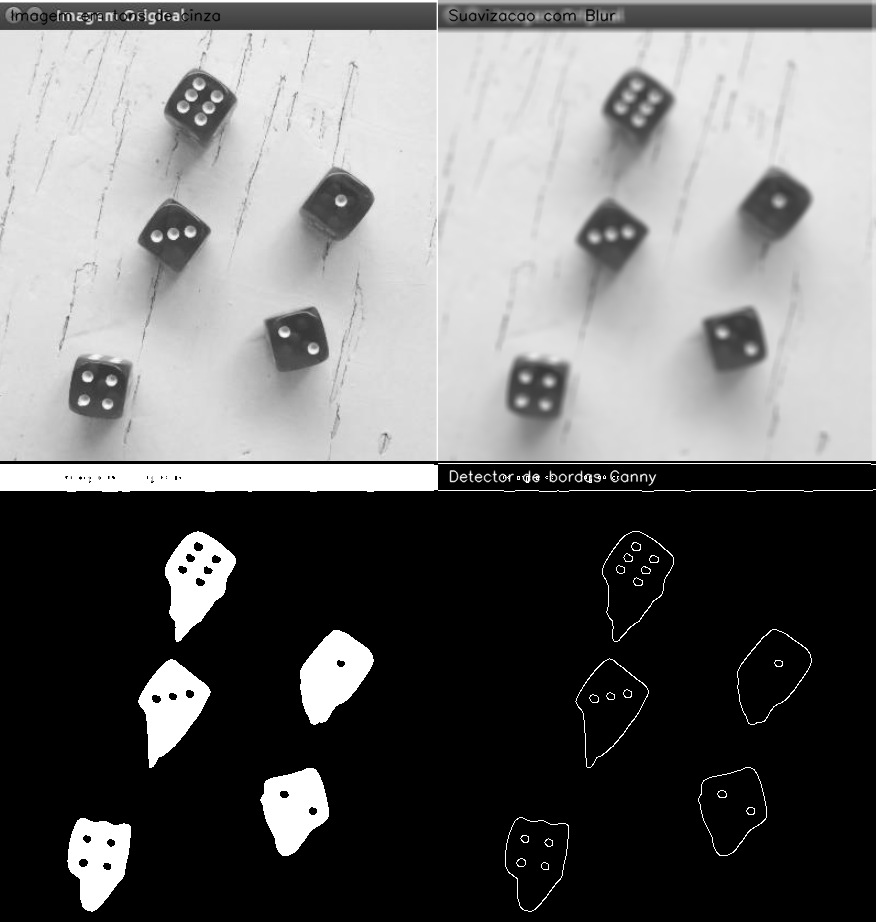

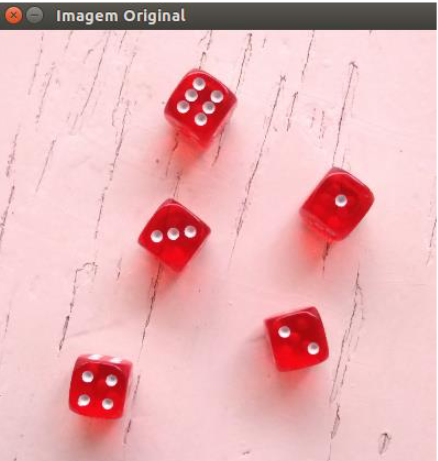

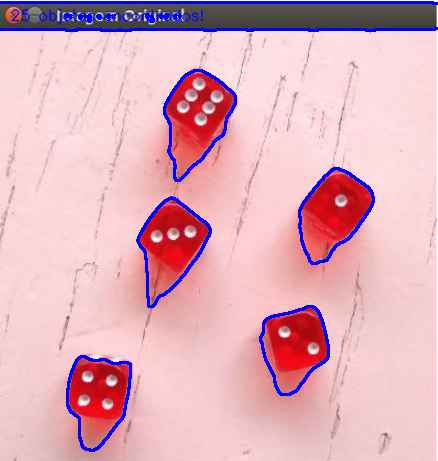

In [ ]:
def escreve(img, texto, cor=(255,0,0)):
  fonte = cv2.FONT_HERSHEY_SIMPLEX 
  cv2.putText(img, texto, (10,20), fonte, 0.5, cor, 0,      cv2.LINE_AA)
imgColorida = cv2.imread('dados.png') #Carregamento da imagem  
#Se necessário o redimensioamento da imagem pode vir aqui.
#Passo 1: Conversão para tons de cinza 
img = cv2.cvtColor(imgColorida, cv2.COLOR_BGR2GRAY)  
#Passo 2: Blur/Suavização da imagem 
suave = cv2.blur(img, (7, 7))  
#Passo 3: Binarização resultando em pixels brancos e pretos 
T = mahotas.thresholding.otsu(suave) 
bin = suave.copy() 
bin[bin > T] = 255 
bin[bin < 255] = 0 
bin = cv2.bitwise_not(bin)                      
#Passo 4: Detecção de bordas com Canny 
bordas = cv2.Canny(bin, 70, 150)  
#Passo 5: Identificação e contagem dos contornos da imagem 
#cv2.RETR_EXTERNAL = conta apenas os contornos externos 
objetos, lx = cv2.findContours(bordas.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) #A variável lx (lixo) recebe dados que não são utilizados
escreve(img, "Imagem em tons de cinza", 0) 
escreve(suave, "Suavizacao com Blur", 0) 
escreve(bin, "Binarizacao com Metodo Otsu", 255) 
escreve(bordas, "Detector de bordas Canny", 255)
temp = np.vstack([  np.hstack([img, suave]),   np.hstack([bin, bordas])])   
cv2_imshow(temp) 
cv2.waitKey(0) 
imgC2 = imgColorida.copy() 
cv2_imshow(imgColorida)
cv2.drawContours(imgC2, objetos, -1, (255, 0, 0), 2) 
escreve(imgC2, str(len(objetos))+" objetos encontrados!") 
cv2_imshow(imgC2) 